In [1]:
from IPython.display import HTML, Image

HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Toggle Code"></form>''')

In [2]:
%run /Users/denis/Documents/Projects/scripts/init.ipy
os.chdir('/Users/denis/Documents/Projects/reports/jupyter-reports/idg-analysis')

# Computational annotation of understudied proteins by coexpression network analysis of The Cancer Genome Atlas (TCGA) data

## Background
The human genome contains nearly 30,000 genes, out of which about 6,000 are estimated to express proteins with the ability to bind drug-like small molecules.  This set of genes is known as the druggable genome.  To date, roughly 5% to 10% of the druggable genome is targeted by FDA-approved drugs, while a significant portion of the remaining genes are understudied, and their functions poorly understood<sup>1</sup>.

Much of biomedical research and the development of therapeutics is focused on a small fraction of the human genome, ignoring many disease-relevant proteins and the associated scientific and commercial opportunities. The National Institutes of Health (NIH) Illuminating the Druggable Genome programme aims to catalyse research around understudied targets<sup>2</sup>.

## Method Overview
In order to characterize the biological function of the understudied elements of the druggable genome, we present a computational method to identify associations between genes and biological terms by performing coexpression network analysis across multiple RNA-seq datasets available in The Cancer Genome Atlas (TCGA) database.

The following is a brief summary of the approach used in the analysis.  For each tumor type available in TCGA, the following steps are performed: 

1. Identify clusters (modules) of coexpressed genes by performing network analysis of RNA-seq data.
2. Biologically characterize these gene clusters by performing enrichment analysis.
3. Associate each understudied protein to the biological term(s) significantly enriched in the cluster it belongs to.

The associations between genes and biological terms are subsequently integrated across all datasets.  This results in a matrix of counts which indicates the number of tumor types in which a gene is associated to a cluster enriched for a specific biological term.  For example: RPL7, a ribosomal protein, may belong to a cluster of genes enriched for the protein translation term in 22 out of 30 profiled tumor types.

While not providing conclusive evidence regarding a gene’s function, this ‘guilt-by-association’ method could provide useful insight in better understanding its biological role.

## Results
### 1. Cluster Analysis
The first part of the section contains shows the results of the network analysis performed on the TCGA Mesothelioma (TCGA-MESO) dataset.  The same analysis is run on all other tumor types.

#### 1.1 Module Identification
First, gene expression modules are identified by performing Weighted Gene Coexpression Network Analysis (WGCNA) on RNA-seq data, using the WGCNA R package<sup>3</sup>.

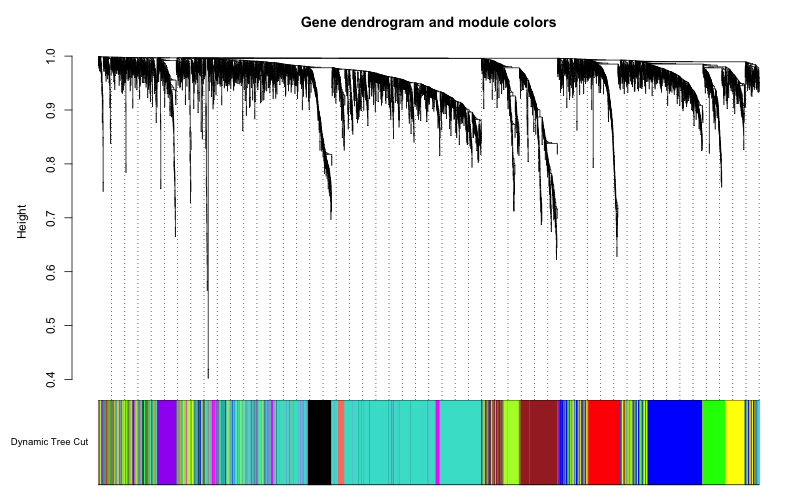

In [3]:
Image('TCGA-MESO/clustering.png')

**Figure 1 | Gene clustering dendrogram and module assignments from TCGA Mesothelioma RNA-seq dataset.**  The dendrogram displays the clustering of the top 25% most variable genes in the TCGA-MESO dataset, as calculated by WGCNA.  Color bars below the dendrogram display module assignments, defined using the Dynamic Tree Cut method.

#### 1.2 Enrichment Analysis
Subsequently, the clusters identified by WGCNA are biologically characterized by performing enrichment analysis using the terms included in the Gene Ontology library.

In [4]:
HTML('''<img src='TCGA-MESO/enrichment2.png'>''')

**Figure 2 | Summary of the top significantly enriched biological terms for selected gene modules.**  The analysis reveals the presence of clusters of genes involved in biological functions widely recognized to be hallmarks of cancer, including enabling metastasis through extracellular matrix organization (yellow  module), sustaining proliferative signaling by inducing cell cycle (red), and inducing angiogenesis (green).  The analysis also reveals a module enriched for terms related to immune response (greenyellow), potentially indicating the presence of infiltrating immune cells.

### 2. Integration of Associations
The second part of the section integrates the associations between genes and pathways across all TCGA tumor types.  The resulting information, obtained by the analysis of over 10,000 human cancer samples, could provide useful insight in comprehending the biological role of the understudied genes.

#### 1. Single gene overview
In the first section, we explore the biological terms and pathways associated to a single gene.

In [5]:
# Read data
pathwayDataframe = pd.read_table('./pathways.txt')

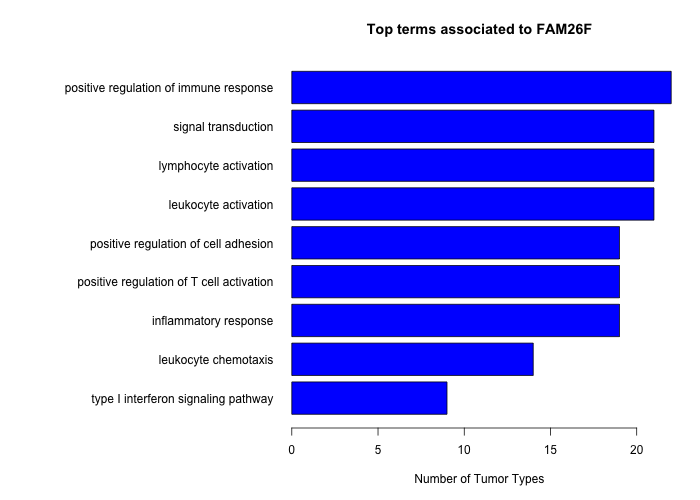

In [6]:
%%R -i pathwayDataframe -h 500 -w 700

# Select gene
geneSymbol <- 'FAM26F'

# Select terms
goTerms <- c('positive regulation of immune response',
             'signal transduction',
             'lymphocyte activation',
             'leukocyte activation',
             'positive regulation of T cell activation',
             'positive regulation of cell adhesion',
             'inflammatory response',
             'leukocyte chemotaxis',
             'type I interferon signaling pathway')

# Get plot dataframe
plotDataframe <- subset(pathwayDataframe, gene_symbol == geneSymbol & termName %in% goTerms)

# Sort
plotDataframe <- plotDataframe[order(plotDataframe$count),]

# Set margins
par(mar=c(5,20,4,2))

# Plot
barplot(plotDataframe$count,
        names.arg = plotDataframe$termName,
        horiz = TRUE,
        las = 1,
        xlab = 'Number of Tumor Types',
        main = paste0('Top terms associated to ', geneSymbol),
        col = 'blue')

**Figure 3 | Summary of the biological terms most reproducibly associated with the FAM26F gene.**  FAM26F is an understudied protein-coding gene which encodes for a pore-forming subunit of a voltage-gated ion channel.  It is annotated with a single term in the Gene Ontology database, cation channel activity (GO:0005261), whose evidence has been inferred by phylogenetic analysis from a better-characterized ancestral gene.  The analysis reveals the gene associated to clusters of genes involved in immune response in a significant number of different tumor types.

#### 2. Heatmap visualization
The predicted gene-term associations can be interactively browsed below:

In [7]:
# Get row annotations
rowAnnotationDataframe = pathwayDataframe[['gene_symbol', 'gene_type']].drop_duplicates().set_index('gene_symbol')

# Get column annotations
columnAnnotationDataframe = pathwayDataframe[['termName', 'termOntology']].drop_duplicates().set_index('termName')

# Get ontology dict
ontologyDict = {'BP': 'Biological Process', 'MF': 'Molecular Function', 'CC': 'Cellular Component'}

# Rename ontology
columnAnnotationDataframe['termOntology'] = [ontologyDict[x] for x in columnAnnotationDataframe['termOntology']]

# Cast
pathwayDataframeCast = pathwayDataframe.pivot(index='gene_symbol', columns='termName', values='count').fillna(0)

# Plot
plotClustergrammerWidget(pathwayDataframeCast, columnAnnotationDataframe, 'termOntology', rowAnnotationDataframe, 'gene_type')

The installed widget Javascript is the wrong version. It must satisfy the semver range ~2.0.28. The widget Javascript is version 2.1.1.


**Figure 4 | Interactive visualization of the associations between Gene Ontology terms and understudied genes.**  The heatmap’s rows represent genes, columns represent Gene Ontology terms, values indicate the number of tumor types in which the gene belongs to a cluster enriched for the corresponding term.  The heatmap reveals the presence of a cluster of genes associated to terms related to the mitochondrion and RNA translation, largely composed of kinases (center).  Another cluster of genes, mostly ion channels, is shown to be associated to terms related to immune response and lymphocyte activation (top).

## Conclusions
* We present a method to associate biological terms to unannotated genes by performing network analysis across over 10,000 samples of over 30 tumor types profiled in TCGA.
* We find that **FAM26F**, an understudied protein-coding gene which encodes for an ion channel, is associated to modules of genes involved in *immune response and lymphocyte activation* in over 20 tumor types.
* We identify **two potentially relevant clusters of genes**:
    * A cluster largely composed of kinases, which is associated to modules of genes involved in *RNA processing and mitochondrial metabolism* in multiple tumor types.
    * A cluster of ion channels, kinases and GPCRs which is associated to modules of genes involved in *immune response and lymphocyte activation* in multiple tumor types.

## References

1.	Illuminating the Druggable Genome - Overview | NIH Common Fund. Available at: https://commonfund.nih.gov/idg/overview. (Accessed: 6th March 2017)
2.	The IDG Knowledge Management Center. Poster : Unexplored opportunities in the druggable human genome. Available at: http://www.nature.com/nrd/posters/druggablegenome/index.html. (Accessed: 6th March 2017)
3.	Langfelder, P. & Horvath, S. WGCNA: an R package for weighted correlation network analysis. BMC Bioinformatics 9, 559 (2008).
